In [1]:
import pyspark
from pyspark.sql import SparkSession

spark = (SparkSession.builder 
    .appName("EDA_Location")
    .config("spark.driver.memory", "4g")
    .config("spark.executor.memory", "4g")
    .getOrCreate()
)

print("Spark version:", spark.version)

Spark version: 3.5.0


In [2]:
from pyspark.sql import functions as F
from pyspark.sql import Window
import pandas as pd
pd.set_option('display.max_columns', None)
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
path = "/home/jovyan/work/data/bronze/"

In [3]:
location_fraud_unbiased_df = (
    spark.read.parquet(f"{path}complete_fraud_data_df.parquet")
    .filter(F.col("target").isNotNull())
    .withColumn("target", 
        F.when(F.col("target") == True, "Fraudulent")
         .when(F.col("target") == False, "Legitimate")
    )
    .withColumn("day", F.to_date(F.col("date")))
    .fillna({"merchant_state": "No_Country"})
    .select("merchant_city", "merchant_state", "zip", 
            "merchant_latitude", "merchant_longitude",
            "client_latitude", "client_longitude",
            "amount", "use_chip", "day", "target", "client_id")
)

Filas_unbiased = location_fraud_unbiased_df.count()
Columnas_unbiased = len(location_fraud_unbiased_df.columns)

print(f"Filas: {Filas_unbiased}, Columnas: {Columnas_unbiased}")
location_fraud_unbiased_df.printSchema()
location_fraud_unbiased_df.limit(5).toPandas()

Filas: 8914963, Columnas: 12
root
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = false)
 |-- zip: string (nullable = true)
 |-- merchant_latitude: double (nullable = true)
 |-- merchant_longitude: double (nullable = true)
 |-- client_latitude: double (nullable = true)
 |-- client_longitude: double (nullable = true)
 |-- amount: double (nullable = true)
 |-- use_chip: string (nullable = true)
 |-- day: date (nullable = true)
 |-- target: string (nullable = true)
 |-- client_id: string (nullable = true)



,merchant_city,merchant_state,zip,merchant_latitude,merchant_longitude,client_latitude,client_longitude,amount,use_chip,day,target,client_id
0,ONLINE,No_Country,NaN,NaN,NaN,39.08,-108.55,25.88,Online Transaction,2011-08-30,Legitimate,1703
1,Derby,KS,67037,37.5530,-97.2549,37.54,-97.25,10.60,Swipe Transaction,2011-08-30,Legitimate,1067
2,Covina,CA,91723,34.0860,-117.8843,34.18,-118.39,46.21,Swipe Transaction,2011-08-30,Legitimate,114
3,Appleton,WI,54913,44.3456,-88.4343,44.26,-88.39,78.00,Swipe Transaction,2011-08-30,Legitimate,1145
4,ONLINE,No_Country,NaN,NaN,NaN,33.91,-118.23,11.50,Online Transaction,2011-08-30,Legitimate,951


In [4]:
print(f"Number of states: {location_fraud_unbiased_df.select('merchant_state').distinct().count()}")

Number of states: 200


In [5]:
USA_states = [
    "CA", "NY", "TX", "FL", "ID", "CT", "IL", "PA", "OH", "GA", 
    "MI", "NC", "NJ", "VA", "WA", "AZ", "AK", "AL", "AR", "CO", 
    "DE", "HI", "IA", "IN", "KS", "KY", "LA", "MA", "MD", "ME", 
    "MN", "MO", "MS", "MT", "ND", "NE", "NH", "NM", "NV", "OK", 
    "OR", "RI", "SC", "SD", "TN", "UT", "VT", "WI", "WV", "WY",
    "DC"
]

In [6]:
location_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .withColumn("merchant_country",
        F.when(F.col("merchant_state").isin(USA_states), "USA").otherwise(F.col("merchant_state"))
    )
)

location_fraud_unbiased_df.limit(5).toPandas()

,merchant_city,merchant_state,zip,merchant_latitude,merchant_longitude,client_latitude,client_longitude,amount,use_chip,day,target,client_id,merchant_country
0,ONLINE,No_Country,NaN,NaN,NaN,39.08,-108.55,25.88,Online Transaction,2011-08-30,Legitimate,1703,No_Country
1,Derby,KS,67037,37.5530,-97.2549,37.54,-97.25,10.60,Swipe Transaction,2011-08-30,Legitimate,1067,USA
2,Covina,CA,91723,34.0860,-117.8843,34.18,-118.39,46.21,Swipe Transaction,2011-08-30,Legitimate,114,USA
3,Appleton,WI,54913,44.3456,-88.4343,44.26,-88.39,78.00,Swipe Transaction,2011-08-30,Legitimate,1145,USA
4,ONLINE,No_Country,NaN,NaN,NaN,33.91,-118.23,11.50,Online Transaction,2011-08-30,Legitimate,951,No_Country


In [7]:
print(f"Number of country: {location_fraud_unbiased_df.select('merchant_country').distinct().count()}")

Number of country: 150


In [8]:
fraudulent_countries_df = (
    location_fraud_unbiased_df
    .filter(F.col("target") == 'Fraudulent')
    .select("merchant_country")
    .distinct()
    .collect()
)

fraudulent_countries_list = [row["merchant_country"] for row in fraudulent_countries_df]
fraudulent_countries_list 

['Italy', 'USA', 'No_Country', 'Haiti', 'Tuvalu']

In [9]:
rate_country_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(
        (F.col("merchant_country").isin(fraudulent_countries_list)) &
        (F.col("merchant_country") != 'No_Country')
    )
    .groupBy("merchant_country", "target")
    .agg(F.count("target").alias("Total"))
    .withColumn(
        "fraud_rate",
        F.round((F.col("Total") / F.sum("Total").over(Window.partitionBy("target"))) * 100, 2)
    )
    .orderBy(F.col("Total").desc())
)

rate_country_fraud_unbiased_df.show()

+----------------+----------+-------+----------+
|merchant_country|    target|  Total|fraud_rate|
+----------------+----------+-------+----------+
|             USA|Legitimate|7806349|     99.98|
|           Italy|Fraudulent|   3061|     67.23|
|           Italy|Legitimate|   1645|      0.02|
|             USA|Fraudulent|   1234|      27.1|
|           Haiti|Fraudulent|    253|      5.56|
|           Haiti|Legitimate|     11|       0.0|
|          Tuvalu|Fraudulent|      5|      0.11|
+----------------+----------+-------+----------+



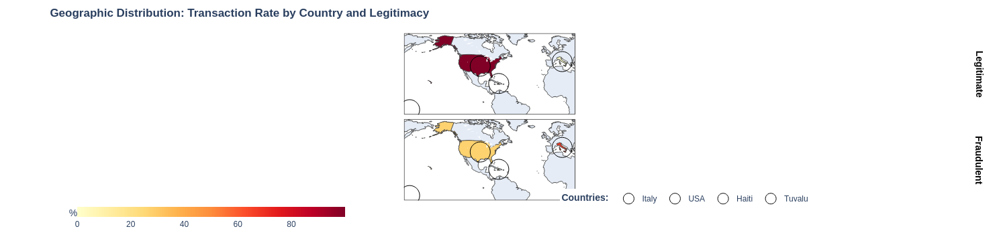

In [10]:
import warnings
warnings.filterwarnings('ignore')

rate_country_fraud_unbiased_pd = rate_country_fraud_unbiased_df.toPandas()

min_tasa = rate_country_fraud_unbiased_pd['fraud_rate'].min()
max_tasa = rate_country_fraud_unbiased_pd['fraud_rate'].max()

rate_country_fraud_unbiased_map = px.choropleth(
    rate_country_fraud_unbiased_pd,
    locations="merchant_country", 
    locationmode="country names",   
    color="fraud_rate",
    facet_row="target",
    scope="world",                 
    color_continuous_scale="YlOrRd", 
    range_color=[min_tasa, max_tasa],
    title="<b>Geographic Distribution: Transaction Rate by Country and Legitimacy</b>",
    labels={"fraud_rate": "Transactions(%)", "merchant_country": "País"}
)


rate_country_fraud_unbiased_map.update_geos(
    projection_type="natural earth",
    lakecolor="white", showlakes=True,
    lataxis_range=[-13, 71],   
    lonaxis_range=[-187, 20]  
)

coords = {
    'Italy': {'lat': 41.87, 'lon': 12.56},
    'USA': {'lat': 37.09, 'lon': -95.71},
    'Haiti': {'lat': 18.97, 'lon': -72.28},
    'Tuvalu': {'lat': -8.52, 'lon': 179.21} 
}

for pais, pos in coords.items():
    rate_country_fraud_unbiased_map.add_trace(
        go.Scattergeo(
            lat=[pos['lat']], lon=[pos['lon']],
            name=pais,
            mode='markers',
            marker=dict(size=30, color='black', symbol='circle-open', opacity=1),
            showlegend=True,
            hoverinfo="skip",
            geo="geo" 
        )
    )
    rate_country_fraud_unbiased_map.add_trace(
        go.Scattergeo(
            lat=[pos['lat']], lon=[pos['lon']],
            name=pais,
            mode='markers',
            marker=dict(size=30, color='black', symbol='circle-open', opacity=1),
            showlegend=False,
            hoverinfo="skip",
            geo="geo2" 
        )
    )

rate_country_fraud_unbiased_map.update_layout(
    title_x=0.05,                
    width=900, height=800, autosize=False,                   
    margin=dict(l=10, r=10, t=50, b=50),    
    coloraxis_colorbar=dict(
        title="%",
        orientation="h", thickness=15, len=0.3,       
        xanchor="center", x=0.2,
        yanchor="top",  y= -0.
    ),
    legend=dict(
        orientation="h", 
        yanchor="bottom", y=-0.049,          
        xanchor="center", x=0.69, 
        title_text="<b>Countries:</b>"
    )
)

rate_country_fraud_unbiased_map.for_each_annotation(lambda a: a.update(
    text=f"<b>{a.text.split('=')[-1]}</b>",
    font=dict(size=14, color="black")
    )
)

rate_country_fraud_unbiased_map.show()

In [11]:
chip_color = {
    'Online Transaction': '#7EA1B5', 
    'Swipe Transaction': '#F2A183', 
    'Chip Transaction': '#89D3C2'
}

In [12]:
number_country_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(F.col("merchant_country").isin(fraudulent_countries_list))
    .groupBy("merchant_country", "target", "use_chip")
    .agg(F.count("target").alias("Total"))
    .orderBy(F.col("Total").desc())
)

number_country_fraud_unbiased_df.show(5)

+----------------+----------+------------------+-------+
|merchant_country|    target|          use_chip|  Total|
+----------------+----------+------------------+-------+
|             USA|Legitimate| Swipe Transaction|4634888|
|             USA|Legitimate|  Chip Transaction|3171461|
|      No_Country|Legitimate|Online Transaction|1035196|
|      No_Country|Fraudulent|Online Transaction|   8779|
|      No_Country|Legitimate|  Chip Transaction|   3890|
+----------------+----------+------------------+-------+
only showing top 5 rows



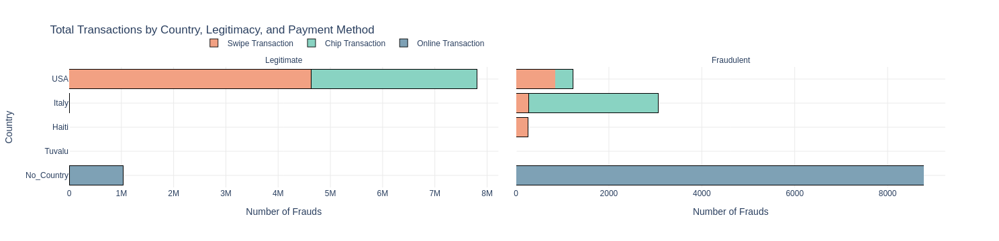

In [13]:
number_country_fraud_unbiased_pd = number_country_fraud_unbiased_df.toPandas()
    
number_country_fraud_unbiased_fig = px.bar(
    number_country_fraud_unbiased_pd,
    x="Total",
    y="merchant_country",
    color="use_chip",
    facet_col= "target",
    orientation="h",
    barmode="stack",
    title="Total Transactions by Country, Legitimacy, and Payment Method",
    color_discrete_map= chip_color,
        labels={"Total": "Number of Frauds", "merchant_country": "Country", 
            "use_chip": "Payment Method"}
)

number_country_fraud_unbiased_fig.update_traces(
    marker_line_color='black', marker_line_width=0.9
)

number_country_fraud_unbiased_fig.update_xaxes(matches=None, showgrid=True, gridcolor="#EAEAEA")
number_country_fraud_unbiased_fig.update_yaxes(autorange="reversed", showgrid=True, gridcolor="#EAEAEA")

number_country_fraud_unbiased_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    legend=dict(title="", orientation="h", yanchor="top", y=1.28, xanchor="left", x=0.15)
)

number_country_fraud_unbiased_fig.for_each_annotation(lambda a: a.update(text=a.text.split('=')[-1]))

number_country_fraud_unbiased_fig.show()

In [14]:
amount_country_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(F.col("merchant_country").isin(fraudulent_countries_list))
    .groupBy("merchant_country", "target", "use_chip")
    .agg(F.sum("amount").alias("Total"))
    .orderBy(F.col("Total").desc())
)

amount_country_fraud_unbiased_df.show(5)

+----------------+----------+------------------+--------------------+
|merchant_country|    target|          use_chip|               Total|
+----------------+----------+------------------+--------------------+
|             USA|Legitimate| Swipe Transaction|1.9111342673000073E8|
|             USA|Legitimate|  Chip Transaction|1.2990153863000044E8|
|      No_Country|Legitimate|Online Transaction| 5.866720522999992E7|
|      No_Country|Fraudulent|Online Transaction|  1061612.3900000001|
|           Italy|Fraudulent|  Chip Transaction|  238236.91000000003|
+----------------+----------+------------------+--------------------+
only showing top 5 rows



En la lista del volumen de dinero de transaccciones por chip, observamos que aquellos sitios donde no hay un registro del pais la suma es negativa (en la anterior tabla observamos que este subconjunto representa un total de 3890 operaciones), deducimos que esto es por alguna particularidad de la naturaleza de algunos reembolsos por chip o por algún error o sesgo del dataset. Dado que este número es ínfimo en comparación al resto de transacciones legítimas sin país atribuido, continuaremos con la forma de representar los gráficos, y evitaremos el uso de gráficos de divergencia

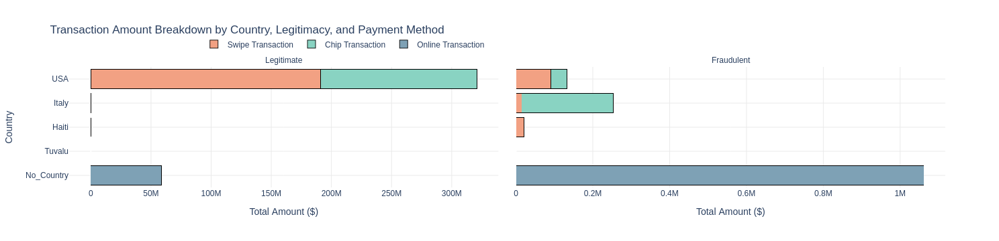

In [15]:
amount_country_fraud_unbiased_pd = amount_country_fraud_unbiased_df.toPandas()
    
amount_country_fraud_unbiased_fig = px.bar(
    amount_country_fraud_unbiased_pd,
    x="Total",
    y="merchant_country",
    color="use_chip",
    facet_col = "target",
    orientation="h",
    barmode="stack",
    title="Transaction Amount Breakdown by Country, Legitimacy, and Payment Method",
    color_discrete_map= chip_color,
    labels={"Total": "Amount", "merchant_country": "Country", 
            "use_chip": "Payment Method"}
)

amount_country_fraud_unbiased_fig.update_traces(
    marker_line_color='black', marker_line_width=0.9
)

amount_country_fraud_unbiased_fig.update_xaxes(matches=None, showgrid=True, gridcolor="#EAEAEA",
                                              title="Total Amount ($)")
amount_country_fraud_unbiased_fig.update_yaxes(autorange="reversed", showgrid=True, gridcolor="#EAEAEA")

amount_country_fraud_unbiased_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    yaxis=dict(autorange="reversed"),

    legend=dict(title="", orientation="h", yanchor="top", y=1.27, xanchor="left", x=0.15)
)

amount_country_fraud_unbiased_fig.for_each_annotation(lambda a: a.update(text=a.text.split('=')[-1]))

amount_country_fraud_unbiased_fig.show()

In [18]:
print(f"Number of countries: {location_fraud_unbiased_df.select('merchant_country').distinct().count()}")

Number of countries: 150


In [16]:
count_year_fraud_df = (
    location_fraud_unbiased_df
    .filter((F.col("target") == 'Fraudulent'))
    .select("merchant_country", "day")
    # .withColumn("day", F.to_date(F.col("date")))
    .groupBy("day", "merchant_country")
    .count()
)

count_year_fraud_df.show(5)

+----------+----------------+-----+
|       day|merchant_country|count|
+----------+----------------+-----+
|2010-03-20|      No_Country|    4|
|2016-02-18|      No_Country|   10|
|2012-03-29|      No_Country|    1|
|2012-01-19|      No_Country|    7|
|2014-03-29|             USA|    3|
+----------+----------------+-----+
only showing top 5 rows



In [17]:
country_color = {
    'USA': '#636EFA', 
    'Italy': '#FFA15A', 
    'Haiti': '#EF553B',
    'Tuvalu': '#AB63FA', 
    'No_Country': '#00CC96'    
}
country_order= ['Italy', 'No_Country', 'USA', 'Haiti', 'Tuvalu']

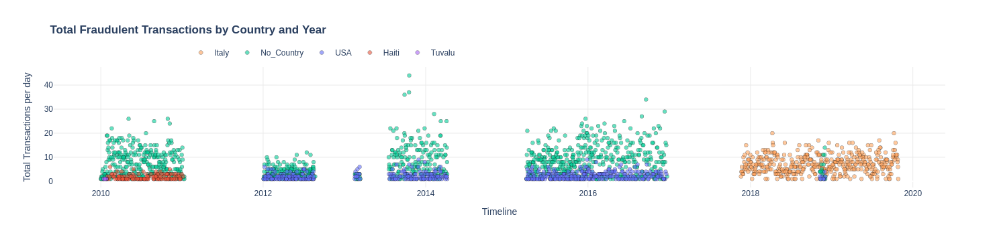

In [18]:
count_year_fraud_pd = count_year_fraud_df.toPandas()

count_year_fraud_fig = px.scatter(
    count_year_fraud_pd,
    x="day",        
    y="count",    
    color="merchant_country", 
    opacity=0.6,
    category_orders={"merchant_country": country_order},
    color_discrete_map= country_color,
    title="<b>Total Fraudulent Transactions by Country and Year</b>",
    labels={"day": "Timeline", "count": "Total Transactions per day",
            "merchant_country": ""}
)

count_year_fraud_fig.update_traces(
    marker=dict(line=dict(color='black', width=0.45)))

count_year_fraud_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    xaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    yaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    legend=dict(title="", orientation="h", yanchor="top", y=1.2, xanchor="left", x=0.15)
)

count_year_fraud_fig.show()


En este gráfico observamos que las operaciones fraudulentas fuera de USA, para Haiti y Tuvalu se dan en el año 2010, mientras que las operaciones fraudulentas en Italia se empiezan a reportar a partir de 2018. Como observamos nuestros datos presentan sesgos, ya que hay muchos años naturales que no están completos.
Además observamos que no hay operaciones de USA fraudulentas registradas en 2010, lo cual podría estar relacionado con la anomalía vista arriba


In [19]:
USA_year_fraud_df = (
    location_fraud_unbiased_df
    .filter((F.col("merchant_country") == 'USA'))
    .select("merchant_country", "target", "day")
    .withColumn("year", F.year(F.col("day")))
    .groupBy("year", "merchant_country", "target")
    .count() 
    .orderBy(F.col("year").desc())
)

USA_year_fraud_df.show()

+----+----------------+----------+------+
|year|merchant_country|    target| count|
+----+----------------+----------+------+
|2019|             USA|Legitimate|676175|
|2018|             USA|Legitimate|813972|
|2018|             USA|Fraudulent|    15|
|2017|             USA|Legitimate|817215|
|2016|             USA|Legitimate|811744|
|2016|             USA|Fraudulent|   352|
|2015|             USA|Fraudulent|   325|
|2015|             USA|Legitimate|809235|
|2014|             USA|Fraudulent|   102|
|2014|             USA|Legitimate|800825|
|2013|             USA|Legitimate|795800|
|2013|             USA|Fraudulent|   210|
|2012|             USA|Legitimate|780561|
|2012|             USA|Fraudulent|   230|
|2011|             USA|Legitimate|764210|
|2010|             USA|Legitimate|736612|
+----+----------------+----------+------+



In [20]:
amount_year_fraud_df = (
    location_fraud_unbiased_df
    .filter((F.col("target") == 'Fraudulent'))
    .select("merchant_country", "amount", "day")
    # .withColumn("day", F.to_date(F.col("day")))
    .groupBy("day", "merchant_country")
    .agg(F.sum("amount").alias("Total")) 
)

amount_year_fraud_df.show(5)

+----------+----------------+-------------------+
|       day|merchant_country|              Total|
+----------+----------------+-------------------+
|2010-03-20|      No_Country|-145.34000000000003|
|2016-02-18|      No_Country|            1230.76|
|2012-03-29|      No_Country|              12.59|
|2012-01-19|      No_Country|             402.04|
|2014-03-29|             USA|             370.13|
+----------+----------------+-------------------+
only showing top 5 rows



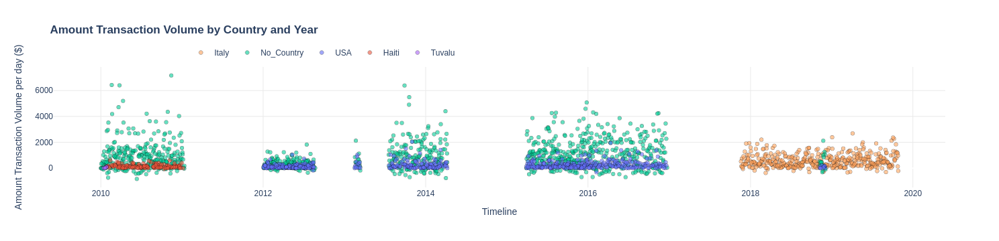

In [21]:
amount_year_fraud_pd = amount_year_fraud_df.toPandas() 

amount_year_fraud_fig = px.scatter(
    amount_year_fraud_pd,
    x="day",        
    y="Total",    
    color="merchant_country", 
    opacity=0.6,
    category_orders={"merchant_country": country_order},
    color_discrete_map= country_color,
    title="<b>Amount Transaction Volume by Country and Year</b>",
    labels={"day": "Timeline", "Total": "Amount Transaction Volume per day ($)", "merchant_country": ""}
)

amount_year_fraud_fig.update_traces(
    marker=dict(line=dict(color='black', width=0.45)))

amount_year_fraud_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    xaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    yaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    legend=dict(title="", orientation="h", yanchor="top", y=1.2, xanchor="left", x=0.15)
)

amount_year_fraud_fig.show()

In [22]:
No_USA_fraud_countries_df = (
    location_fraud_unbiased_df
    .filter(F.col("merchant_country").isin(['Italy', 'Haiti', 'Tuvalu']))
    .groupBy("merchant_country", "merchant_city", "zip", "target")
    .agg(F.count("target").alias("Total"))
    .withColumn(
        "fraud_rate",
        F.round((F.col("Total") / F.sum("Total").over(Window.partitionBy("target"))) * 100, 5)
    )
    .orderBy(F.col("fraud_rate").desc())
)

No_USA_fraud_countries_df.limit(10).toPandas()

,merchant_country,merchant_city,zip,target,Total,fraud_rate
0,Italy,Rome,None,Legitimate,1645,99.33575
1,Italy,Rome,None,Fraudulent,3061,92.22657
2,Haiti,Port au Prince,None,Fraudulent,253,7.62278
3,Haiti,Port au Prince,None,Legitimate,11,0.66425
4,Tuvalu,Funafuti,None,Fraudulent,5,0.15065


Como observamos en la anterior tabla de los paises donde se registran fraude que no son de USA, su registro de localización a nivel de ciudad se da solo en la capital, por lo que el análisis siguiente lo haremos solo en USA. 

In [23]:
rate_USAstates_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(F.col("merchant_country") == 'USA')
    .groupBy("merchant_state", "target")
    .agg(F.count("target").alias("Total"))
    .withColumn(
        "fraud_rate",
        F.round((F.col("Total") / F.sum("Total").over(Window.partitionBy("target"))) * 100, 2)
    )
    .orderBy(F.col("fraud_rate").desc())
)

rate_USAstates_fraud_unbiased_df.show(5)

+--------------+----------+------+----------+
|merchant_state|    target| Total|fraud_rate|
+--------------+----------+------+----------+
|            OH|Fraudulent|   316|     25.61|
|            CA|Legitimate|956229|     12.25|
|            CA|Fraudulent|   127|     10.29|
|            TX|Legitimate|677063|      8.67|
|            NY|Legitimate|574463|      7.36|
+--------------+----------+------+----------+
only showing top 5 rows



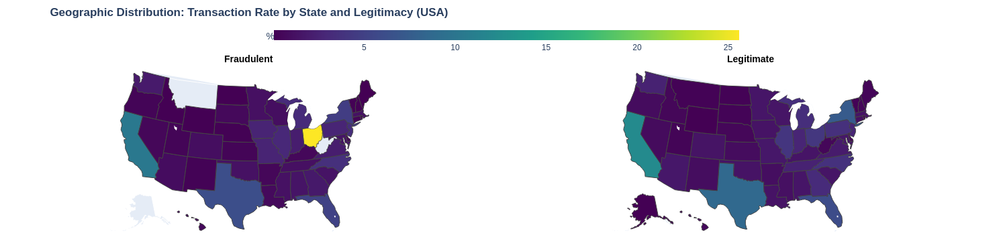

In [24]:
rate_USAstates_fraud_unbiased_pd = rate_USAstates_fraud_unbiased_df.toPandas()
min_tasa = rate_USAstates_fraud_unbiased_pd['fraud_rate'].min()
max_tasa = rate_USAstates_fraud_unbiased_pd['fraud_rate'].max()

rate_USAstates_fraud_unbiased_map = px.choropleth(
    rate_USAstates_fraud_unbiased_pd,
    locations="merchant_state",      
    locationmode="USA-states",        
    color="fraud_rate", 
    facet_col="target",
    scope="usa",                      
    color_continuous_scale="Viridis",
    range_color=[min_tasa, max_tasa],
    title="<b>Geographic Distribution: Transaction Rate by State and Legitimacy (USA)</b>",
    labels={"fraud_rate": "Participación de Fraude (%)", "merchant_state": "Estado"}
)

rate_USAstates_fraud_unbiased_map.update_layout(
    title_x=0.05,                
    height=400,                 
    margin=dict(l=10, r=10, t=10, b=10), 
    
    coloraxis_colorbar=dict(
        title="%",
        orientation="h",  
        thickness=15, len=0.5,           
        x=0.5, xanchor="center",
        y=1.05, yanchor="bottom"
    )
)

rate_USAstates_fraud_unbiased_map.for_each_annotation(lambda a: a.update(
    text=f"<b>{a.text.split('=')[-1]}</b>",
    font=dict(size=14, color="black")
    )
)

rate_USAstates_fraud_unbiased_map.show()

In [26]:
rate_USAzip_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(F.col("merchant_country") == 'USA')
    .groupBy("merchant_latitude", "merchant_longitude", "target")
    .agg(F.count("target").alias("Total"))
    .withColumn(
        "fraud_rate",
        F.round((F.col("Total") / F.sum("Total").over(Window.partitionBy("target"))) * 100, 5)
    )
    .orderBy(F.col("fraud_rate").desc())
)

rate_USAzip_fraud_unbiased_df.show(10)

+-----------------+------------------+----------+-----+----------+
|merchant_latitude|merchant_longitude|    target|Total|fraud_rate|
+-----------------+------------------+----------+-----+----------+
|          40.6003|          -81.5366|Fraudulent|  213|  17.26094|
|          40.5148|          -81.6604|Fraudulent|   23|   1.86386|
|            43.18|          -95.4817|Fraudulent|    8|    0.6483|
|          40.6166|          -83.0693|Fraudulent|    7|   0.56726|
|          40.9637|          -81.4211|Fraudulent|    7|   0.56726|
|          40.5876|          -83.1271|Fraudulent|    7|   0.56726|
|          40.6136|          -82.5175|Fraudulent|    6|   0.48622|
|          40.8094|          -81.9483|Fraudulent|    5|   0.40519|
|          29.7023|          -95.4611|Fraudulent|    4|   0.32415|
|          38.7936|          -90.7854|Fraudulent|    4|   0.32415|
+-----------------+------------------+----------+-----+----------+
only showing top 10 rows



In [27]:
USAzip_fraud_unbiased_pd = rate_USAzip_fraud_unbiased_df.toPandas()
USAzip_fraud_pd = USAzip_fraud_unbiased_pd[USAzip_fraud_unbiased_pd['target'] == 'Fraudulent']
USAzip_leg_pd = USAzip_fraud_unbiased_pd[USAzip_fraud_unbiased_pd['target'] == 'Legitimate']

print("Total de transacciones de Fraude en el país:", USAzip_fraud_pd["Total"].sum())
print("Total de transacciones Legítimas en el país:", USAzip_leg_pd["Total"].sum())
print("Puntos en mapa de Fraude:", len(USAzip_fraud_pd))
print("Puntos en mapa Legítimo:", len(USAzip_leg_pd))

Total de transacciones de Fraude en el país: 1234
Total de transacciones Legítimas en el país: 7806349
Puntos en mapa de Fraude: 831
Puntos en mapa Legítimo: 23920


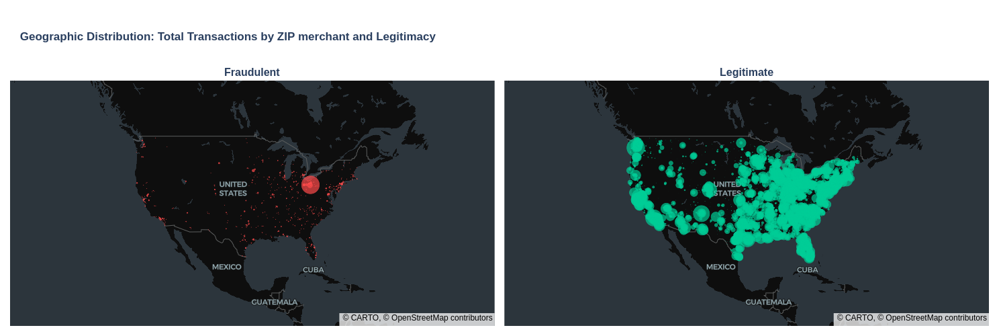

In [28]:
total_USAzip_fig_final = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

total_USAzip_fig_fraud = px.scatter_map(
    USAzip_fraud_pd,
    lat="merchant_latitude",     
    lon="merchant_longitude",     
    size="Total",
    color_discrete_sequence=["#FF4B4B"]
)

total_USAzip_fig_legit = px.scatter_map(
    USAzip_leg_pd,
    lat="merchant_latitude",     
    lon="merchant_longitude",     
    size="Total",
    color_discrete_sequence=["#00CC96"]
)

for trace in total_USAzip_fig_fraud.data:
    trace.name = "Fraudulent"
    total_USAzip_fig_final.add_trace(trace, row=1, col=1)

for trace in total_USAzip_fig_legit.data:
    trace.name = "Legitimate"
    total_USAzip_fig_final.add_trace(trace, row=1, col=2)

total_USAzip_fig_final.update_layout(
    title_text="<b>Geographic Distribution: Total Transactions by ZIP merchant and Legitimacy</b>",
    title_x=0.02,
    height=500, width=800, autosize=False,
    margin={"r":15, "t":120, "l":15, "b":15},
    map1=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1),
    map2=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1)
)

total_USAzip_fig_final.show()


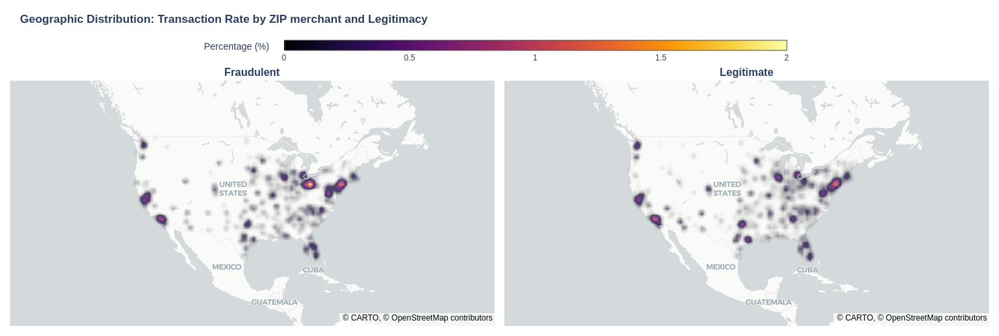

In [29]:
rate_USAzip_fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

rate_USAzip_fig.add_trace(
    go.Densitymap(
        lat= USAzip_fraud_pd['merchant_latitude'], 
        lon= USAzip_fraud_pd['merchant_longitude'], 
        z= USAzip_fraud_pd['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=True, 
        zmin=0.0, zmax=2,  
        colorbar=dict(
            title="Percentage (%)", orientation="h", 
            y=1.05, x=0.5, 
            xanchor="center",thickness=15, len=0.6
        )
    ), row=1, col=1
)

rate_USAzip_fig.add_trace(
    go.Densitymap(
        lat=USAzip_leg_pd['merchant_latitude'], 
        lon=USAzip_leg_pd['merchant_longitude'], 
        z=USAzip_leg_pd['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=False,
        zmin=0.0, zmax=2                 
    ), row=1, col=2
)

rate_USAzip_fig.update_layout(
    title_text="<b>Geographic Distribution: Transaction Rate by ZIP merchant and Legitimacy</b>",
    title_x=0.02,
    margin={"r":15, "t":120, "l":15, "b":15},
    height=500, width=800, autosize=False,
    map=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1),
    map2=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1)
)

rate_USAzip_fig.show()

In [30]:
client_fraud_unbiased_df = (
    location_fraud_unbiased_df
    # .filter(F.col("merchant_country") == 'USA')
    .groupBy("client_latitude", "client_longitude", "target")
    .agg(F.count("target").alias("Total"))
    .withColumn(
        "fraud_rate",
        F.round((F.col("Total") / F.sum("Total").over(Window.partitionBy("target"))) * 100, 5)
    )
    .orderBy(F.col("fraud_rate").desc())
)

client_fraud_unbiased_df.show(5)

+---------------+----------------+----------+------+----------+
|client_latitude|client_longitude|    target| Total|fraud_rate|
+---------------+----------------+----------+------+----------+
|          29.76|          -95.38|Legitimate|121585|   1.36587|
|          29.76|          -95.38|Fraudulent|   143|   1.07261|
|          40.64|          -73.94|Legitimate| 71275|    0.8007|
|          25.77|           -80.2|Legitimate| 65670|   0.73773|
|          25.77|           -80.2|Fraudulent|    96|   0.72007|
+---------------+----------------+----------+------+----------+
only showing top 5 rows



In [31]:
client_fraud_unbiased_pd = client_fraud_unbiased_df.toPandas()
client_fraud_pd = client_fraud_unbiased_pd[client_fraud_unbiased_pd["target"] == "Fraudulent"]
client_leg_pd = client_fraud_unbiased_pd[client_fraud_unbiased_pd["target"] == "Legitimate"]

print("Total de transacciones de Fraude:", client_fraud_pd["Total"].sum())
print("Total de transacciones Legítimas:", client_leg_pd["Total"].sum())
print("Puntos en mapa de Fraude:", len(client_fraud_pd))
print("Puntos en mapa Legítimo:", len(client_leg_pd))

Total de transacciones de Fraude: 13332
Total de transacciones Legítimas: 8901631
Puntos en mapa de Fraude: 980
Puntos en mapa Legítimo: 993


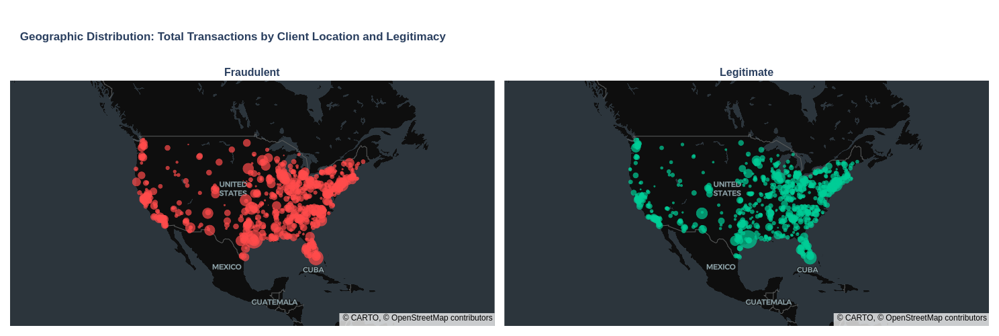

In [32]:
client_fraud_unbiased_fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

client_fraud_fig = px.scatter_map(
    client_fraud_pd,
    lat="client_latitude",    
    lon="client_longitude", 
    size="Total",
    color_discrete_sequence=["#FF4B4B"]
)

client_leg_fig = px.scatter_map(
    client_leg_pd,
    lat="client_latitude", 
    lon="client_longitude",
    size="Total",
    color_discrete_sequence=["#00CC96"]
)

for trace in client_fraud_fig.data:
    trace.name = "Fraudulent"
    client_fraud_unbiased_fig.add_trace(trace, row=1, col=1)

for trace in client_leg_fig.data:
    trace.name = "Legitimate"
    client_fraud_unbiased_fig.add_trace(trace, row=1, col=2)


client_fraud_unbiased_fig.update_layout(
    title_text="<b>Geographic Distribution: Total Transactions by Client Location and Legitimacy</b>",
    title_x=0.02,
    height=500, width=800, autosize=False,
    margin={"r":15, "t":120, "l":15, "b":15},
    map1=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1),
    map2=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1)
)

client_fraud_unbiased_fig.show()


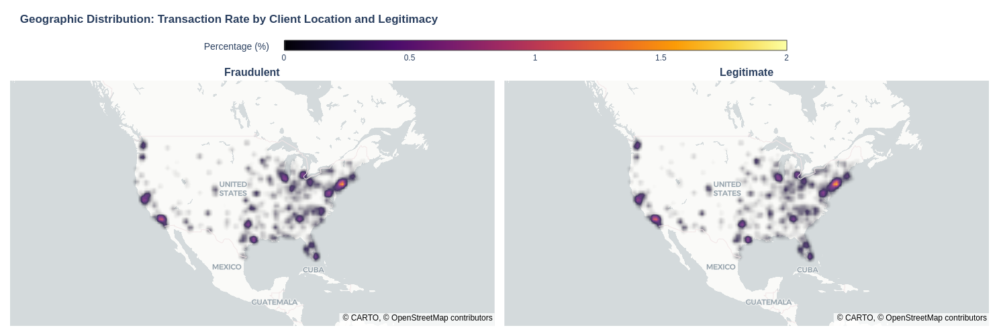

In [33]:
rate_client_fraud_unbiased_fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

rate_client_fraud_unbiased_fig.add_trace(
    go.Densitymap(
        lat=client_fraud_pd['client_latitude'], 
        lon=client_fraud_pd['client_longitude'],
        z=client_fraud_pd['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=True, 
        zmin=0.0, zmax=2,  
        colorbar=dict(
            title="Percentage (%)", orientation="h", 
            y=1.05, x=0.5, 
            xanchor="center", thickness=15, len=0.6
        )
    ), row=1, col=1
)

rate_client_fraud_unbiased_fig.add_trace(
    go.Densitymap(
        lat=client_leg_pd['client_latitude'],      
        lon=client_leg_pd['client_longitude'], 
        z=client_leg_pd['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=False,
        zmin=0.0, zmax=2                 
    ), row=1, col=2
)

rate_client_fraud_unbiased_fig.update_layout(
    title_text="<b>Geographic Distribution: Transaction Rate by Client Location and Legitimacy</b>",
    title_x=0.02,
    margin={"r":15, "t":120, "l":15, "b":15},
    height=500, width=800, autosize=False,
    map1=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1),
    map2=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1)
)

rate_client_fraud_unbiased_fig.show()


Analizamos el historial de transacciones de algunos clientes

In [35]:
fraudulent_client_df = (
    location_fraud_unbiased_df
    .select("client_id", "target")
    .filter(F.col("target") == 'Fraudulent')
    .distinct()
    .collect()
)

fraudulent_client_list = [row["client_id"] for row in fraudulent_client_df]
print("Total de clientes con operaciones fraudulentas:", len(fraudulent_client_list))

Total de clientes con operaciones fraudulentas: 1196


In [36]:
client_df = (
    location_fraud_unbiased_df
    .filter(F.col("client_id").isin(fraudulent_client_list))
    .select("client_id", "day", "merchant_city", "merchant_state", 
            "merchant_latitude", "merchant_longitude",
            "client_latitude", "client_longitude",
            "use_chip", "target",)
)

Filas_client = client_df.count()
Columnas_client = len(client_df.columns)

print(f"Filas: {Filas_client}, Columnas: {Columnas_client}")
client_df.printSchema()
client_df.limit(5).toPandas()

Filas: 8766436, Columnas: 10
root
 |-- client_id: string (nullable = true)
 |-- day: date (nullable = true)
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = false)
 |-- merchant_latitude: double (nullable = true)
 |-- merchant_longitude: double (nullable = true)
 |-- client_latitude: double (nullable = true)
 |-- client_longitude: double (nullable = true)
 |-- use_chip: string (nullable = true)
 |-- target: string (nullable = true)



,client_id,day,merchant_city,merchant_state,merchant_latitude,merchant_longitude,client_latitude,client_longitude,use_chip,target
0,1703,2011-08-30,ONLINE,No_Country,NaN,NaN,39.08,-108.55,Online Transaction,Legitimate
1,1067,2011-08-30,Derby,KS,37.5530,-97.2549,37.54,-97.25,Swipe Transaction,Legitimate
2,114,2011-08-30,Covina,CA,34.0860,-117.8843,34.18,-118.39,Swipe Transaction,Legitimate
3,1145,2011-08-30,Appleton,WI,44.3456,-88.4343,44.26,-88.39,Swipe Transaction,Legitimate
4,951,2011-08-30,ONLINE,No_Country,NaN,NaN,33.91,-118.23,Online Transaction,Legitimate


In [1]:
from geopy.distance import geodesic
import math

def calculate_distance(row):
    if math.isnan(row["merchant_latitude"]) or math.isnan(row["merchant_longitude"]):
        return -1000
    return geodesic(
        (row["client_latitude"], row["client_longitude"]),
        (row["merchant_latitude"], row["merchant_longitude"])
    ).km

def plot_client_behaviour_spatial(client_ID):
    client_transaction_df = client_df.filter(F.col("client_id").isin(client_ID))
    client_transaction_pd = client_transaction_df.toPandas()
    client_transaction_pd['day_dt'] = pd.to_datetime(client_transaction_pd['day'])
    client_transaction_pd['hover_date_str'] = client_transaction_pd['day_dt'].dt.strftime("%A, %d %b %Y")
    ordered_days = sorted(client_transaction_pd['day'].astype(str).unique())
    client_transaction_pd["distance_km"] = client_transaction_pd.apply(calculate_distance, axis=1)
    
    client_transaction_fig = px.scatter(
        client_transaction_pd,
        x="day",        
        y="distance_km",    
        color="target",
        facet_row="use_chip",         
        facet_row_spacing=0.08,                    
        opacity=0.6,
        category_orders={"target": ["Legitimate", "Fraudulent"]},
        custom_data=["hover_date_str", "use_chip", "merchant_state", "merchant_city"],
        title= f"<b>Transactions Behaviour, ClientID: {client_ID}</b>",
        labels={"day": "Date", "distance_km": "Distance (Km)"}
    )
    
    client_transaction_fig.update_traces(
        marker=dict(line=dict(color='black', width=0.45)),
        hovertemplate="<b>%{customdata[0]}</b><br>Chip: %{customdata[1]}\
        <br>state: %{customdata[2]}<br>city: %{customdata[3]}\
        <br>Distance: %{y:,.2f}<extra></extra>"
    )
    
    client_transaction_fig.update_layout(
        plot_bgcolor="#F5F5F5", paper_bgcolor="white", 
        height=750, width=850, autosize=False,
        legend=dict(title="", orientation="h", yanchor="top", y=1.08, xanchor="left", x=0.65)
    )
    
    client_transaction_fig.update_xaxes(
        showticklabels=True, tickformat="%A, %d %b %Y", matches="x", tickangle=-45, nticks=12,
        type='category', categoryorder='array', categoryarray=ordered_days,
        showspikes=True, spikemode='across', spikethickness=1, spikedash='dash', spikecolor="#040404",
    
    ) 
    
    client_transaction_fig.update_xaxes(showticklabels=False, row=2)
    client_transaction_fig.update_xaxes(showticklabels=False, row=3)
    
    client_transaction_fig.update_yaxes(showgrid=True, gridcolor="#EAEAEA")
    
    client_transaction_fig.for_each_annotation(lambda a: a.update(
        text=f"<b>{a.text.split('=')[-1]}</b>",
        font=dict(size=14, color="black")
        )
    )
    
    client_transaction_fig.add_vline(x="2011-01-08", line_width=1.5, line_dash="dash")
    client_transaction_fig.add_vline(x="2015-03-30", line_width=1.5, line_dash="dash")
    
    return client_transaction_fig


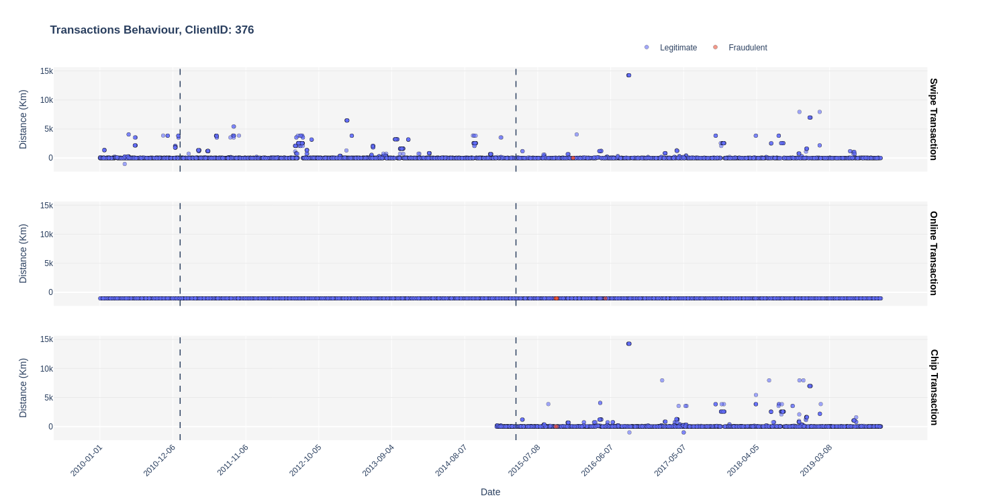

In [38]:
plot_client_behaviour_spatial(fraudulent_client_list[0])

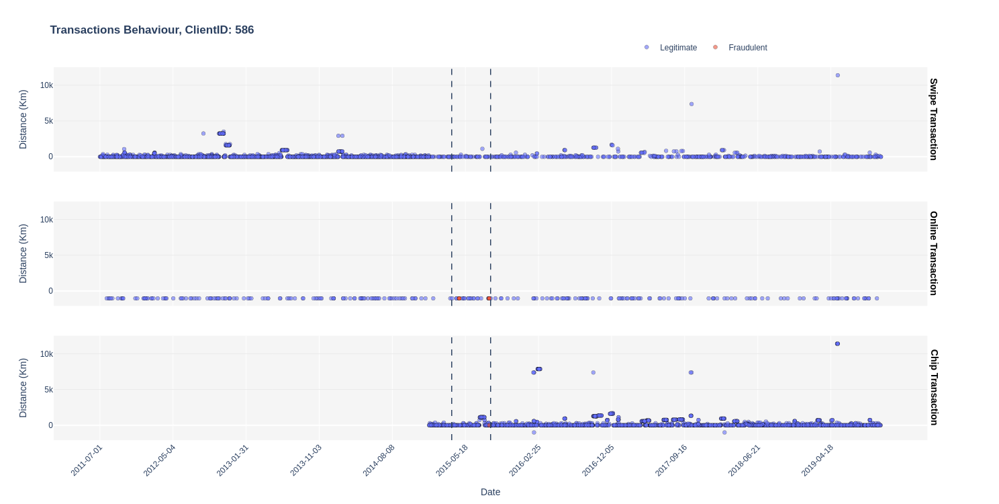

In [39]:
plot_client_behaviour_spatial(fraudulent_client_list[1])

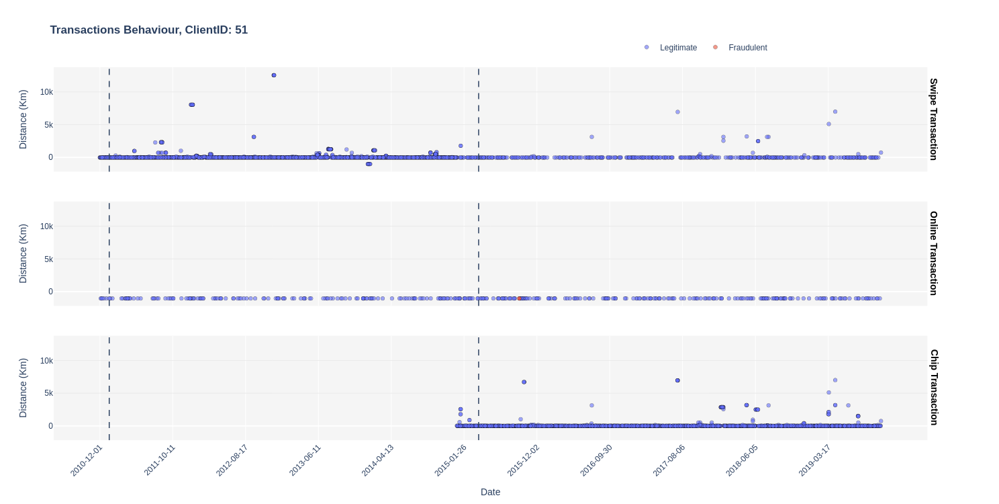

In [40]:
plot_client_behaviour_spatial(fraudulent_client_list[2])